# LDA VK comments

author: Elvira Dzhuraeva


Цель - построить LDA модель и получить интерпретируемые топики. Попробовать посчитать тематические профили и получить их визуализацию на двумерной плоскости при помощи TSNE
 
 1. Загрузите датасет. Если используете данные вк, то после загрузки воспользуйтесь следующим кодом:

from ast import literal_eval
bag_of_words = data.text_bow.apply(literal_eval)

где data - это загруженный датасет. Операция необходима, так как предварительно уже была проведена предобработка текстов и получено представление bag-of-words, так что остаётся его лишь прочитать из датасета

2. Используя gensim, добавьте биграммы к имеющемуся bag_of_words представлению

3. Составьте словарь из терминов (corpora.Dictionary)

4. По словарю терминов при помощи метода filter_extremes проведите фильтрацию слов по частоте встречаемости. На данных вк рекомендую следующие параметры: (no_below=3, no_above=0.4, keep_n=3*10**6)

5. Наконец, составьте итоговый корпус документов при помощи метода doc2bow. Рекомендую его сохранить (например, в pickle формате), на случай, если что-то где-то пойдет не так

6. По получившемуся корпусу постройте LDA модель, если используете данные вк, рекомендую параметры (eval_every=20, num_topics=30, passes=5). Не забудьте сохранить саму модель и её аттрибут expElogBeta, также при помощи метода show_topics возьмите по 100 самых вероятных слов для каждой темы

7. При помощи wordcloud визуализируйте каждый из получившихся топиков и попробуйте их проинтерпретировать. Чтобы не возиться долго с функциями для визуализации, можно взять их отсюда - https://github.com/DmitrySerg/top-russian-music/blob/master/models/clean_visualization.ipynb

8. Наконец, постройте тематические профили по интересующим вас группировкам (в случае с вк можно построить средние тематические вектора по жанрам или по исполнителям, если у вас собственные данные, попробуйте подумать, как можно было бы сгруппировать ваши документы, чтобы все-таки построить профили групп), и визуализируйте их при помощи TSNE


In [1]:
import numpy as np
import pandas as pd
import pickle

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

plt.style.use('ggplot')
%matplotlib inline

In [2]:
df = pd.read_csv('reduced_comments_vk.csv')

In [3]:
df.head()

,Unnamed: 0,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,stickers,text,video,text_bow,comment_len
0,9,NaN,146608415,52228413_282387_282503,2019-01-01 17:43:48,"[id415608045|Иван],\nВ который раз, весь мир л...",NaN,1,NaN,estrada,лепс,NaN,id415608045 иван который весь мир лететь чужое...,NaN,"['id415608045', 'иван', 'который', 'весь', 'ми...",79.0
1,103,NaN,197130573,52228413_282259_282287,2018-12-31 13:47:29,С Наступающим!. Пусть старый год уходя оставит...,NaN,2,NaN,estrada,лепс,NaN,наступать пусть старый год уходить оставить ве...,NaN,"['наступать', 'пусть', 'старый', 'год', 'уходи...",42.0
2,107,NaN,-52228413,52228413_282158_282162,2018-12-30 21:04:56,Автор музыки и слов - Дмитрий Митькин.\n\nВ ко...,NaN,29,NaN,estrada,лепс,NaN,автор музыка слово дмитрий митькина который ве...,NaN,"['автор', 'музыка', 'слово', 'дмитрий', 'митьк...",82.0
3,130,NaN,197130573,52228413_282158_282211,2018-12-30 23:04:28,Ура!!!🔥🔥🔥🔥🔥🔥🔥🔥 Предновогодняя премьера от непо...,🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥👍👍👍👍👍👍👍👍💪💪💪💪💪💪💪💪🔥🔥😎😎😎,6,NaN,estrada,лепс,NaN,ура предновогодний премьера неподражаемый непр...,NaN,"['ура', 'предновогодний', 'премьера', 'неподра...",43.0
4,190,NaN,208434900,52228413_282010_282031,2018-12-29 17:18:25,"Легко. ""Аминь""- лучший клип ГВ за последнее вр...",NaN,4,NaN,estrada,лепс,NaN,легко аминь хороший клип последний время полны...,NaN,"['легко', 'аминь', 'хороший', 'клип', 'последн...",70.0


In [4]:
df.shape

(105377, 16)

### Data Cleaning

In [5]:
df = df[df['comment_len']>40]

In [6]:
df.shape

(105377, 16)

In [7]:
df["music_style"].value_counts()

popsa      34723
rock       23523
rap        14680
metal      10097
estrada     9166
pank        5169
classic     3906
indi        1634
shanson      871
dance        833
jazz         775
Name: music_style, dtype: int64

In [8]:
from ast import literal_eval
bag_of_words = df.text_bow.apply(literal_eval)

In [9]:
len(bag_of_words)

105377

In [10]:
bag_of_words[:5]

0    [id415608045, иван, который, весь, мир, лететь...
1    [наступать, пусть, старый, год, уходить, остав...
2    [автор, музыка, слово, дмитрий, митькина, кото...
3    [ура, предновогодний, премьера, неподражаемый,...
4    [легко, аминь, хороший, клип, последний, время...
Name: text_bow, dtype: object

### Добавим биграммы

In [11]:
bigram = gensim.models.Phrases(bag_of_words, min_count=5, threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
bigram_mod.save('bigram_mod.pkl')
bag_of_words = [bigram_mod[w] for w in bag_of_words]
with open('bigrams.pkl', 'wb') as f:
    pickle.dump(bag_of_words, f)


In [12]:
len(bag_of_words)

105377

### Составим словарь

In [13]:
bag_of_words[5][:10]

['григорий_лепс',
 'это',
 'стоить',
 'плакать',
 'небо',
 'номер',
 'менять',
 'желать',
 'наш',
 'судьба']

In [14]:
id2word = corpora.Dictionary(bag_of_words)
id2word.save('id2word.pkl')

In [15]:
len(id2word)

211508

### Фильтрация слов по частоте встречаемости

In [16]:
id2word.filter_extremes(no_below=3, no_above=0.4, keep_n=3*10**6)

In [17]:
len(id2word)

74971

### Финальный корпус

In [19]:
corpus = [id2word.doc2bow(text) for text in bag_of_words]

In [20]:
id2word[0]

'больно'

### Построим саму модель

In [21]:
lda_model = gensim.models.ldamodel.LdaModel(
    corpus, 
    id2word=id2word, 
    eval_every=20,
    random_state=42,
    num_topics=30, 
    passes=5
    )

lda_model.save('lda_default.pkl')

In [22]:
lda_model.save('lda_default.pkl', separately=['alpha', 'expElogbeta', 'sstats'])

In [23]:
topics = lda_model.show_topics(num_topics=30, num_words=100, formatted=False)

In [24]:
topics[:10]

[(0,
  [('один', 0.021433452),
   ('идти', 0.018619802),
   ('время', 0.015150657),
   ('лицо', 0.014553348),
   ('который', 0.012367162),
   ('рука', 0.008706678),
   ('дом', 0.0072871866),
   ('такой', 0.0066330265),
   ('смотреть', 0.0059954706),
   ('увидеть', 0.0059592375),
   ('сидеть', 0.005915628),
   ('последний', 0.0054526925),
   ('видеть', 0.005452625),
   ('место', 0.005174466),
   ('ряд', 0.0049773576),
   ('улица', 0.0048334696),
   ('конец', 0.004515443),
   ('сук', 0.0044208164),
   ('этот', 0.004327097),
   ('два', 0.004160196),
   ('машина', 0.0041124998),
   ('какой', 0.0040651937),
   ('момент', 0.0040548723),
   ('работать', 0.0038263109),
   ('выйти', 0.0037280084),
   ('начать', 0.0036725835),
   ('армия', 0.0034839679),
   ('нога', 0.0034587278),
   ('военный', 0.003283689),
   ('ещё', 0.0032592083),
   ('начинать', 0.0032360663),
   ('пара', 0.0031404593),
   ('история', 0.003134014),
   ('минута', 0.0031214582),
   ('толпа', 0.003117141),
   ('завтра', 0.0029

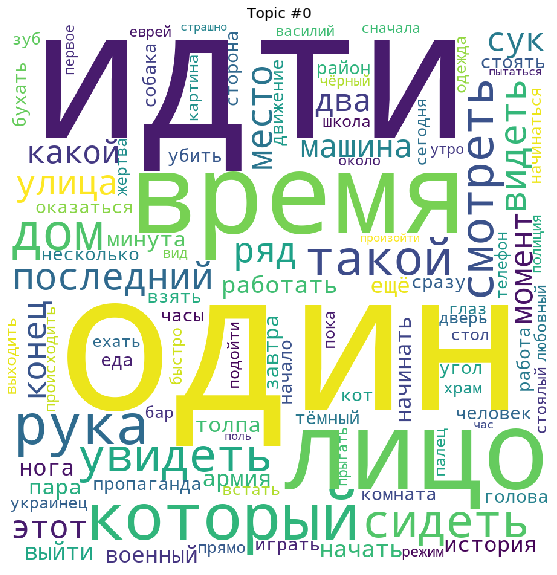

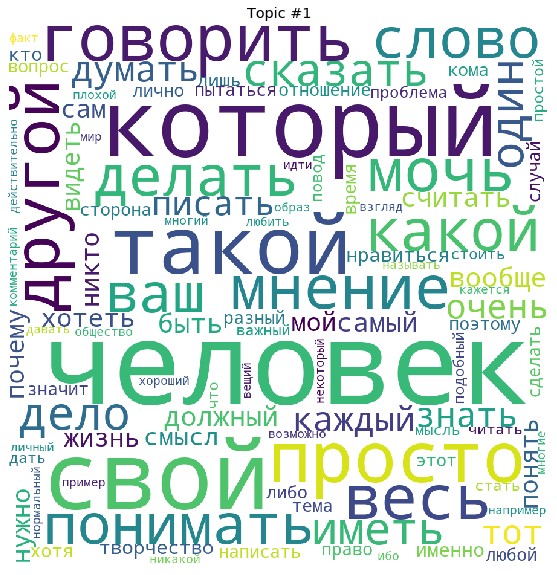

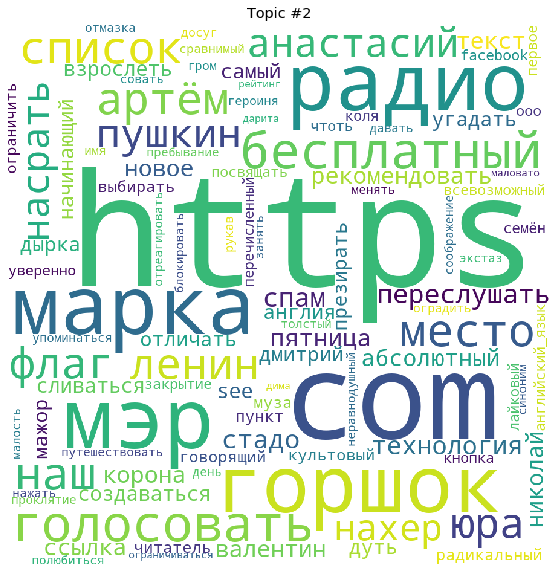

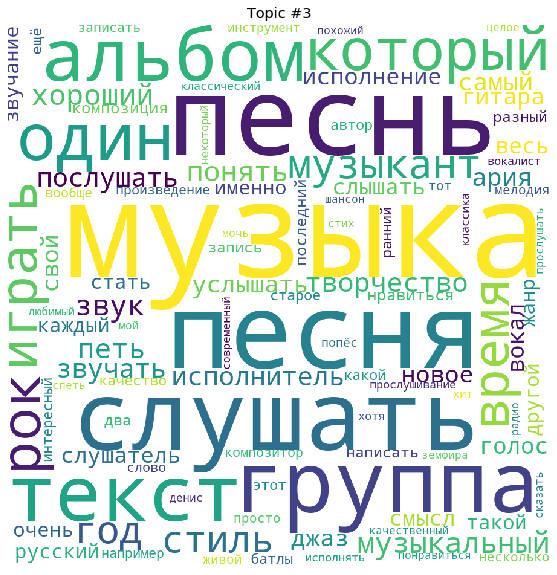

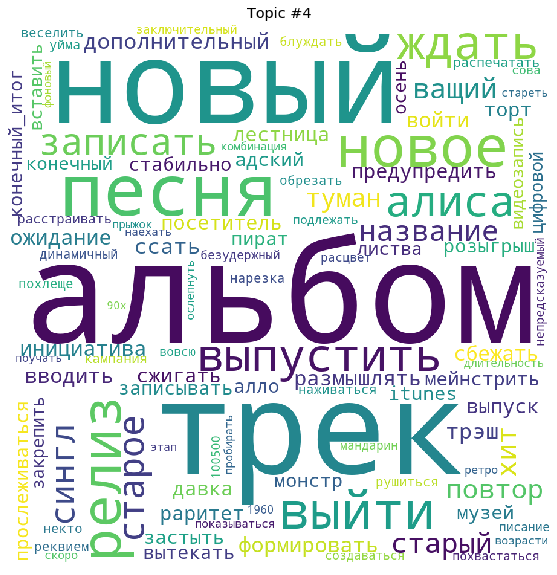

...

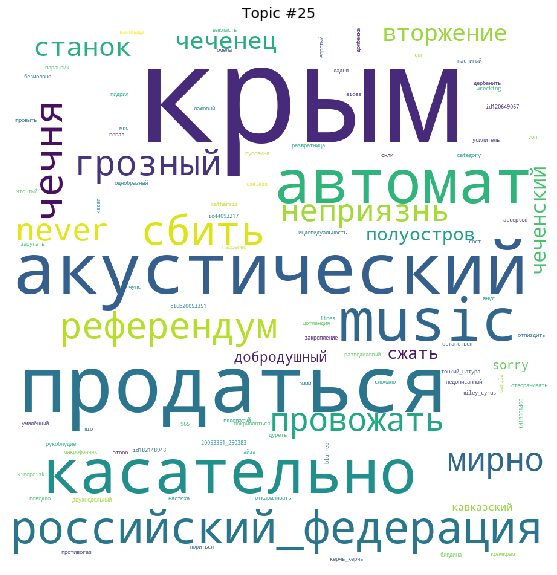

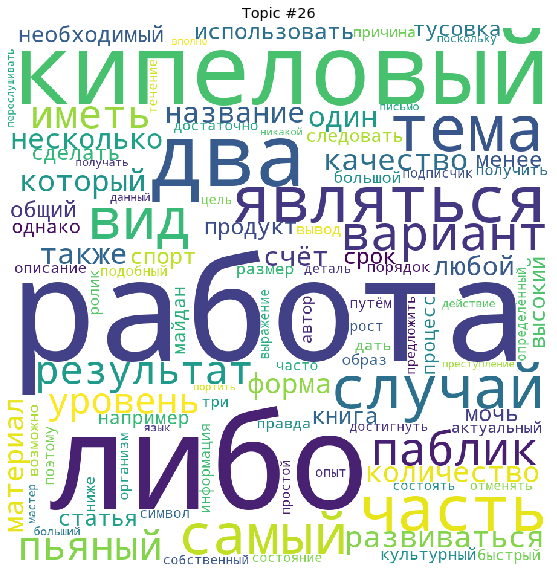

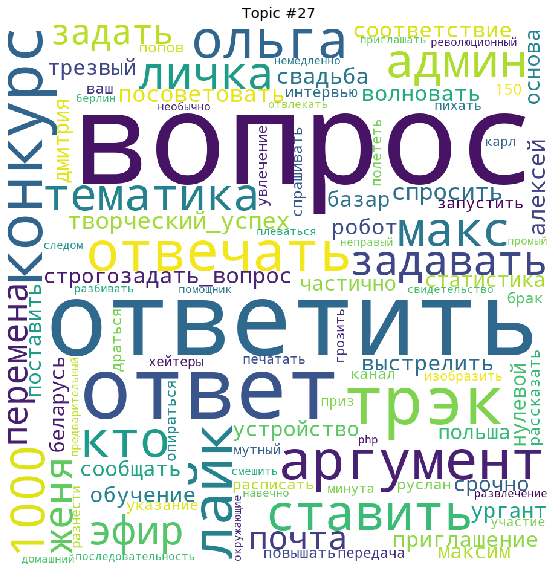

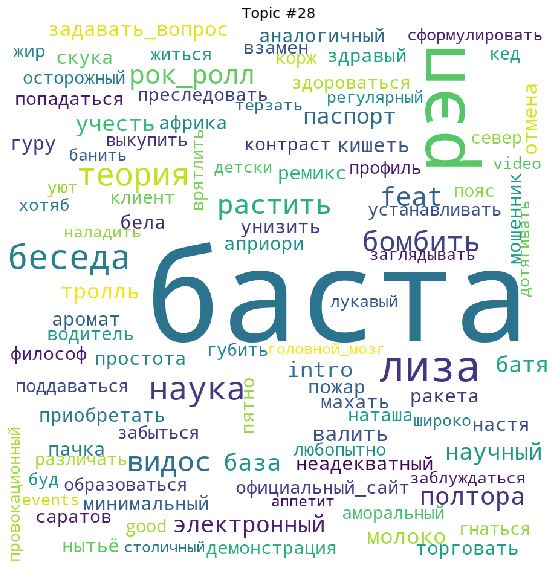

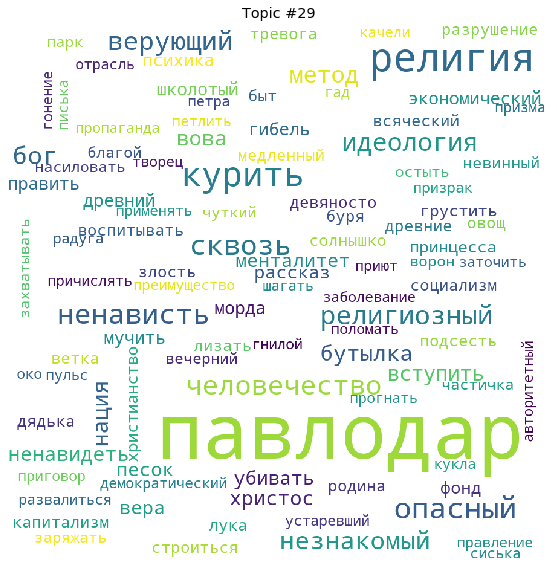

In [25]:
for t in range(lda_model.num_topics):
    plt.figure(figsize=(15, 10))
    plt.imshow(WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
               .fit_words(dict(topics[t][1])))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()

In [39]:
themes_headers = {
    0: "Обо всем и ни о чем",
    1: "Человек и мнение",
    2: "Политика города",
    3: "Группы и конкурсы",
    4: "Новые треки и клипы",
    5: "Благодарности и комплементы",
    6: "Позитивные эмоции",
    7: "Интернет и соц сети",
    8: "Гастроли",
    9: "О Жизни",
    10: "Тренды",
    11: "Насилие. Митинги. Опрессия",
    12: "Клипы",
    13: "Общее негативное",
    14: "Участники группы в вк",
    15: "Концерты",
    16: "Имена",
    17: "Гос Политика",
    18: "Места концертов",
    19: "Фильмы и киносъемка",
    20: "Рэп",
    21: "Романтика",
    22: "Тусовки",
    23: "Рекламы. Объявления. Афиши",
    24: "Семья",
    25: "Крым. политика",
    26: "Работа. Культура. Развитие",
    27: "Спор людей в вк",
    28: "Рэп",
    29: "Вера и социалогия"
}

In [27]:
from tqdm import tqdm_notebook

In [28]:
df.music_style.value_counts()

popsa      34723
rock       23523
rap        14680
metal      10097
estrada     9166
pank        5169
classic     3906
indi        1634
shanson      871
dance        833
jazz         775
Name: music_style, dtype: int64

In [29]:
def topicProfileGenre(model, music_style, dataset, corpus, genre=True):
    theme_results = []
    r = model.num_topics

    if genre:
        num = dataset[dataset.music_style == music_style].index.get_values() 
    else:
        num = dataset[dataset.performer == music_style].index.get_values() 

    theme_profile = np.zeros(r)
    err = 0

    for i in num:
#         try:
            # вытаскиваем тематический профиль текущего юзера
        cur_user_prof = model.get_document_topics(corpus[i])

        # сортируем по номерам тем
        cur_user_prof = sorted(cur_user_prof, key=lambda w: w[0], reverse=True)      

        ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
        prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
        theme_profile[ind] += prob        # Увеличиваем соответствующие веса
#         except:
#             err += 1 # Если возникла ошибка, значит профиль битый 

    # Нормируем к единице
#     print('Доля битых профилей для {}:'.format(music_style), err/len(num))
    theme_profile = theme_profile / np.sum(theme_profile)
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile

In [30]:
music_style_themes = {}
for music_style in tqdm_notebook(df['music_style'].unique()):
    theme = topicProfileGenre(lda_model, music_style, df, corpus)
    music_style_themes[music_style] = theme

In [41]:
def profilePlot(theme_profile, music_style, themes=themes_headers):
    theme_profile = theme_profile[music_style]
    sorted_prof = sorted(theme_profile, key=lambda w: w[1], reverse=True)   
    
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,-1)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                 cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=them )
    ax.set_title('Theme profile {}: \n'.format(music_style))
    plt.show()

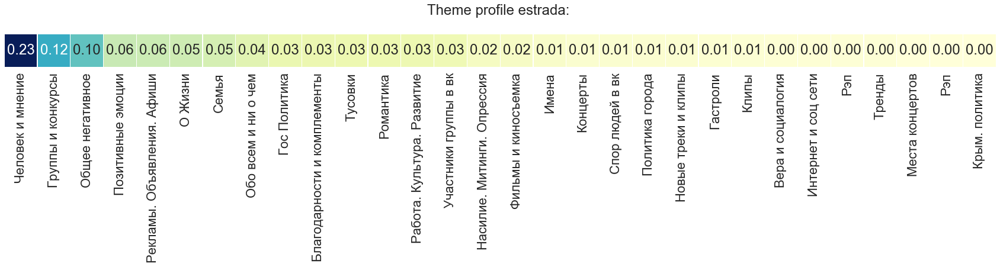

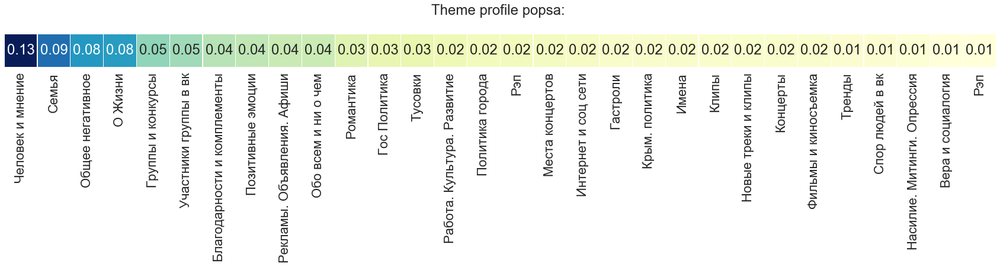

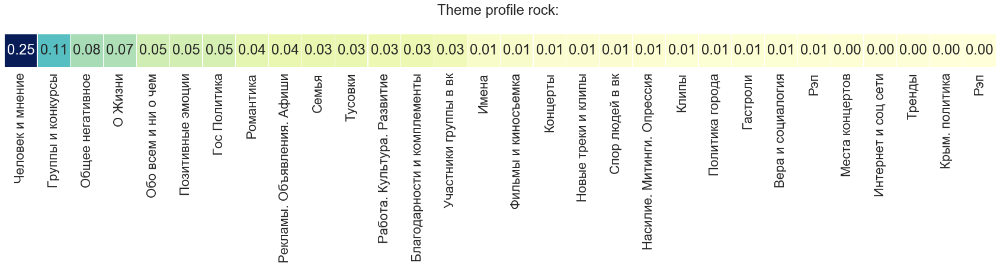

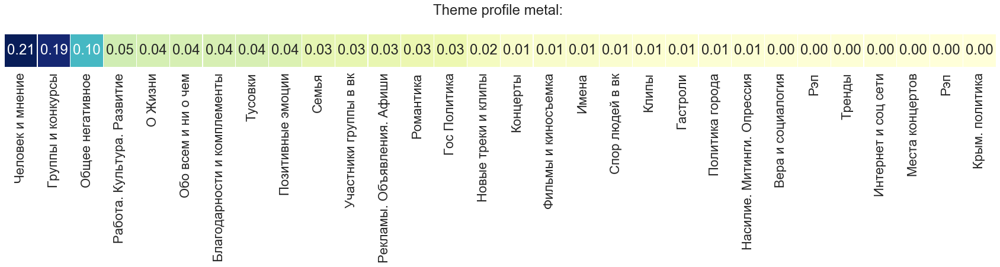

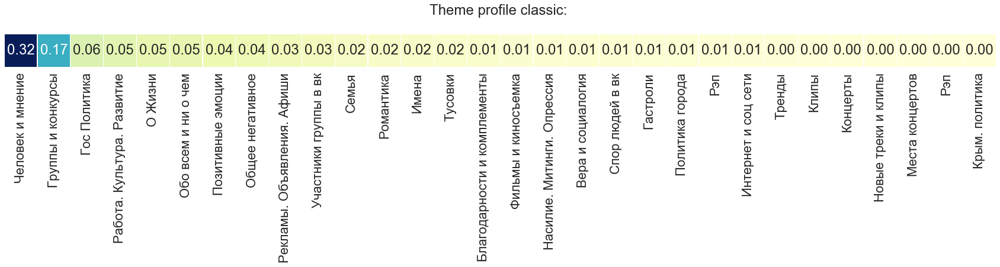

...

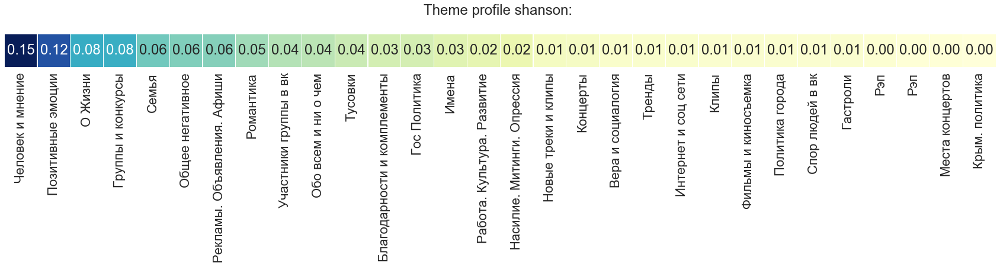

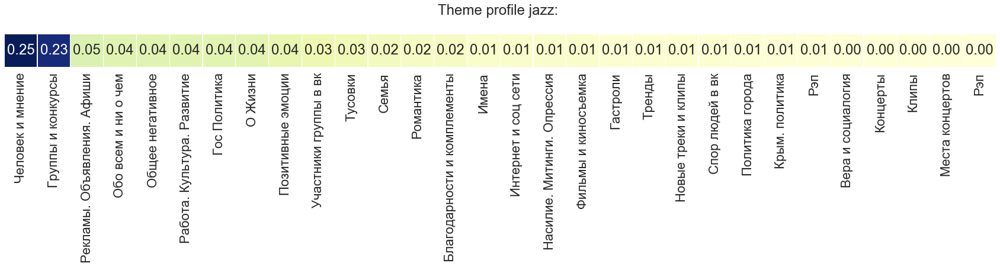

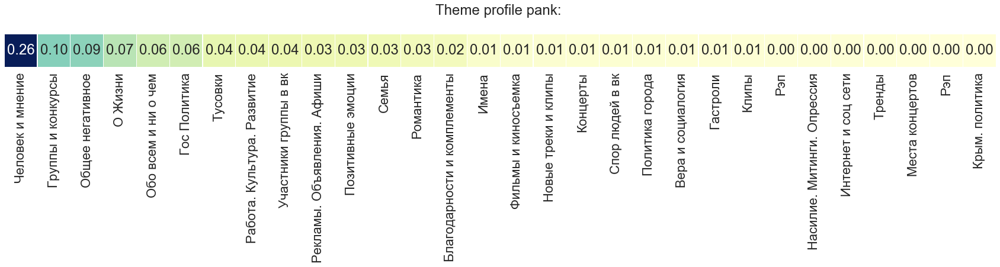

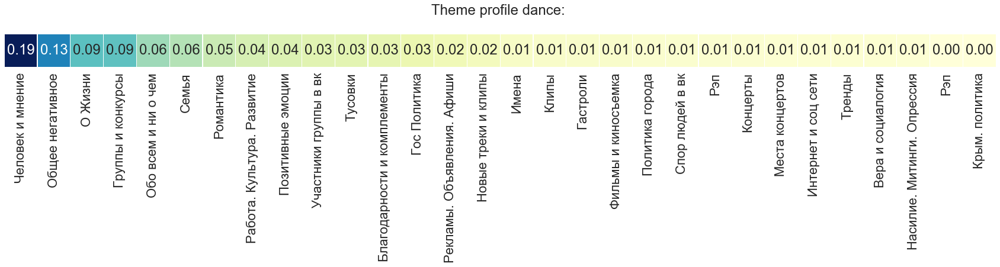

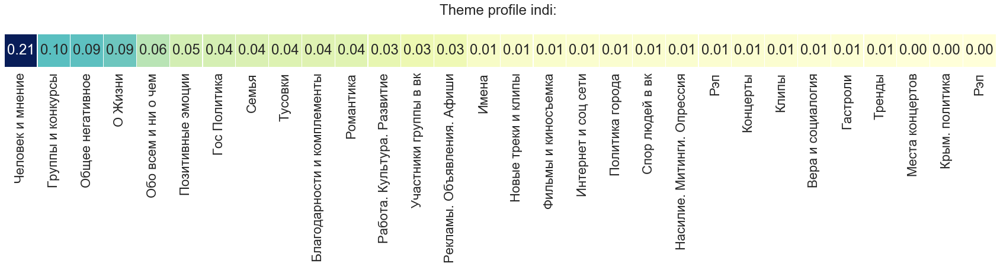

In [42]:
for music_style in df['music_style'].unique():
    profilePlot(music_style_themes, music_style)


### TSNE

In [44]:
music_style_themes_clusters = {}
for k, v in music_style_themes.items():
    music_style_themes_clusters[k] = [prob[1] for prob in v]
    
music_style_themes_clusters = pd.DataFrame(music_style_themes_clusters).T

In [45]:
from MulticoreTSNE import MulticoreTSNE

In [47]:
tsne = MulticoreTSNE()
tsne_features = tsne.fit_transform(music_style_themes_clusters)

In [53]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

trace = go.Scatter(
    x = tsne_features[:, 0],
    y = tsne_features[:, 1],
    mode = 'markers+text',
    text = music_style_themes_clusters.index,
    textposition='top center'
)

data = [trace]

layout = go.Layout(
    autosize=False,
    width=700,
    height=700
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='size-margins')